# House Price Prediction - Advance Regression

# Problem Statement

Task 1:- Prepare a complete data analysis report on the given data.

Task 2:-a) Create a robust machine learning algorithm to accurately predict the price of the house given the various factors across the market.      
            b) Determine the relationship between the house features and how the price varies based on this.

Task3:- Come up with suggestions for the customer to buy the house according to the area, price and other requirements.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [2]:
data=pd.read_csv("data.csv")

In [3]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


# BASIC CHECKS

In [4]:
pd.set_option('display.max_columns',None) #it's display all columns in the data
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


In [7]:
data.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,NaN,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [8]:
#print all columns names
for col in data.columns:
    print(col)

Id
MSSubClass
MSZoning
LotFrontage
LotArea
Street
Alley
LotShape
LandContour
Utilities
LotConfig
LandSlope
Neighborhood
Condition1
Condition2
BldgType
HouseStyle
OverallQual
OverallCond
YearBuilt
YearRemodAdd
RoofStyle
RoofMatl
Exterior1st
Exterior2nd
MasVnrType
MasVnrArea
ExterQual
ExterCond
Foundation
BsmtQual
BsmtCond
BsmtExposure
BsmtFinType1
BsmtFinSF1
BsmtFinType2
BsmtFinSF2
BsmtUnfSF
TotalBsmtSF
Heating
HeatingQC
CentralAir
Electrical
1stFlrSF
2ndFlrSF
LowQualFinSF
GrLivArea
BsmtFullBath
BsmtHalfBath
FullBath
HalfBath
BedroomAbvGr
KitchenAbvGr
KitchenQual
TotRmsAbvGrd
Functional
Fireplaces
FireplaceQu
GarageType
GarageYrBlt
GarageFinish
GarageCars
GarageArea
GarageQual
GarageCond
PavedDrive
WoodDeckSF
OpenPorchSF
EnclosedPorch
3SsnPorch
ScreenPorch
PoolArea
PoolQC
Fence
MiscFeature
MiscVal
MoSold
YrSold
SaleType
SaleCondition
SalePrice


In [9]:
pd.set_option('display.max_rows', None)
data.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [10]:
#So we have null values in this dataset

# DOMAIN ANALYSIS

* **SalePrice :-** the property's sale price in dollars. This is the target variable that you're trying to predict.
* **MSSubClass:-** The building class
* **MSZoning:-** The general zoning classification
* **LotFrontage:-** Linear feet of street connected to property
* **LotArea:-** Lot size in square feet
* **Street:-** Type of road access
* **Alley:-** Type of alley access
* **LotShape:-** General shape of property
* **LandContour:-** Flatness of the property
* **Utilities:-** Type of utilities available
* **LotConfig:-** Lot configuration
* **LandSlope:-** Slope of property
* **Neighborhood:-** Physical locations within Ames city limits
* **Condition1:-** Proximity to main road or railroad
* **Condition2:-** Proximity to main road or railroad (if a second is present)
* **BldgType:-** Type of dwelling
* **HouseStyle:-** Style of dwelling
* **OverallQual:-** Overall material and finish quality
* **OverallCond:-** Overall condition rating
* **YearBuilt:-** Original construction date
* **YearRemodAdd:-** Remodel date
* **RoofStyle:-** Type of roof
* **RoofMatl:-** Roof material
* **Exterior1st:-** Exterior covering on house
* **Exterior2nd:-** Exterior covering on house (if more than one material)
* **MasVnrType:-** Masonry veneer type
* **MasVnrArea:-** Masonry veneer area in square feet
* **ExterQual:-** Exterior material quality
* **ExterCond:-** Present condition of the material on the exterior
* **Foundation:-** Type of foundation
* **BsmtQual:-** Height of the basement
* **BsmtCond:-** General condition of the basement
* **BsmtExposure:-** Walkout or garden level basement walls
* **BsmtFinType1:-** Quality of basement finished area
* **BsmtFinSF1:-** Type 1 finished square feet
* **BsmtFinType2:-** Quality of second finished area (if present)
* **BsmtFinSF2:-** Type 2 finished square feet
* **BsmtUnfSF:-** Unfinished square feet of basement area
* **TotalBsmtSF:-** Total square feet of basement area
* **Heating:-** Type of heating
* **HeatingQC:-** Heating quality and condition
* **CentralAir:-** Central air conditioning
* **Electrical:-** Electrical system
* **1stFlrSF:-** First Floor square feet
* **2ndFlrSF:-** Second floor square feet
* **LowQualFinSF:-** Low quality finished square feet (all floors)
* **GrLivArea:-** Above grade (ground) living area square feet
* **BsmtFullBath:** Basement full bathrooms
* **BsmtHalfBath:** Basement half bathrooms
* **FullBath:-** Full bathrooms above grade
* **HalfBath:-** Half baths above grade
* **Bedroom:-** Number of bedrooms above basement level
* **Kitchen:-** Number of kitchens
* **KitchenQual:-** Kitchen quality
* **TotRmsAbvGrd:-** Total rooms above grade (does not include bathrooms)
* **Functional:-** Home functionality rating
* **Fireplaces:-** Number of fireplaces
* **FireplaceQu:-** Fireplace quality
* **GarageType:-** Garage location
* **GarageYrBlt:-** Year garage was built
* **GarageFinish:-** Interior finish of the garage
* **GarageCars:-** Size of garage in car capacity
* **GarageArea:-** Size of garage in square feet
* **GarageQual:-** Garage quality
* **GarageCond:-** Garage condition
* **PavedDrive:-** Paved driveway
* **WoodDeckSF:-** Wood deck area in square feet
* **OpenPorchSF:-** Open porch area in square feet
* **EnclosedPorch:-** Enclosed porch area in square feet
* **3SsnPorch:-** Three season porch area in square feet
* **ScreenPorch:-** Screen porch area in square feet
* **PoolArea:-** Pool area in square feet
* **PoolQC:-** Pool quality
* **Fence:-** Fence quality
* **MiscFeature:-** Miscellaneous feature not covered in other categories
* **MiscVal:-** $Value of miscellaneous feature
* **MoSold:-** Month Sold
* **YrSold:-** Year Sold
* **SaleType:-** Type of sale
* **SaleCondition:-** Condition of sale

In [11]:
date_columns = data.select_dtypes(include=['datetime64']).columns

In [12]:
date_columns

Index([], dtype='object')

# EXPLORATORY DATA ANALYSIS

In [ ]:
import sweetviz as sv#importing sweetviz library 
my_report = sv.analyze(data)#syntax to use sweetviz
my_report.show_html()#Default arguments will generate to "SWEETVIZ_REPORT.html"

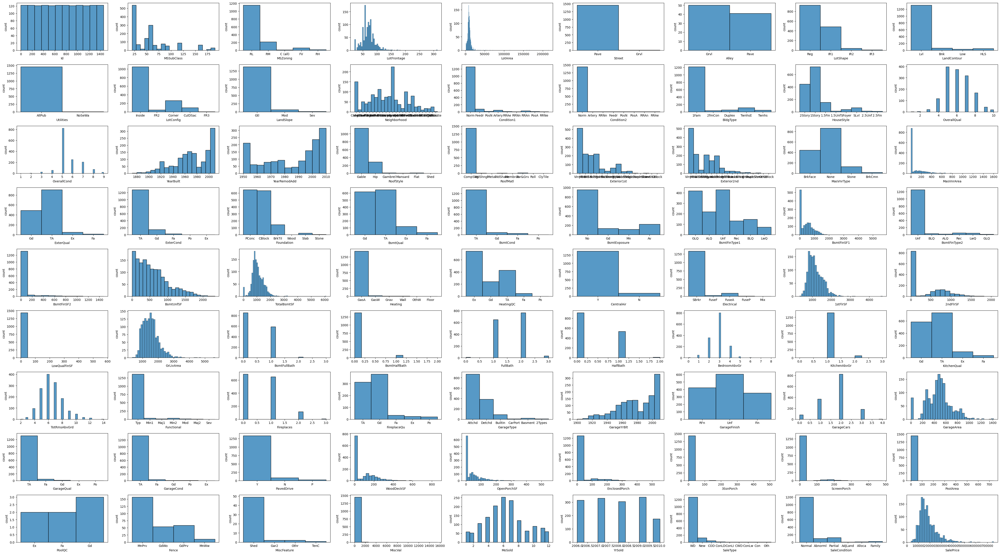

In [13]:
plt.figure(figsize=(45,25),facecolor='white')
plotnumber=1

for column in data:
  if plotnumber<=81:
    ax=plt.subplot(9,9,plotnumber)
    sns.histplot(x=data[column])
    plt.xlabel(column,fontsize=10)
    plt.ylabel("count",fontsize=10)
  plotnumber+=1
plt.tight_layout()

# Insights of Univarient Analysis
* Lot Frontage: The ideal lot frontage for many falls between 50 to 100 feet.
* Street Preference: Paved streets are overwhelmingly preferred.
* Lot Shape: Regular and slightly irregular lot shapes are popular choices.
* Property Flatness: Nearly all buyers seek level properties.
* Utilities: All-public utilities are unanimously favored.
* Lot Configuration: "Inside" lot configurations are highly sought after.
* Slope Preference: Gentle slopes are the preferred terrain for many.
* Condition Norm: "Normal" conditions dominate in both Condition1 and Condition2 preferences.
* Dwelling Type: Single-family homes remain the top choice.
* Quality Rating: Buyers tend to gravitate towards OverallQual ratings of 5 - 8, with 5 being particularly popular.
* Year of Construction: Newer homes built after 2000 are the preferred choice.
* Roofing: Gable roofs with CompShg roofing materials are in high demand.
* Pools: Pools are not a top priority for most buyers.
* Garage Preference: Attached garages are the favored option.
* Foundation Types: Pconc and CBlock foundations have a substantial following.
* Bedroom Count: Three bedrooms are the preferred configuration for half of the buyers.
* Shed Inclination: Over 80% of buyers prefer houses with sheds.
* Garage Size: Garage areas ranging from 400 to 600 sq ft are popular, preferred by 35%.
* Price Range: The majority of houses fall within the 100k to 200k price range.

# Bivariet Analysis

In [14]:
cat_data=data.select_dtypes(include=["O"])
print("categorical columns",cat_data.columns)

categorical columns Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')


In [15]:
cat_data

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
5,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,Wood,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,MnPrv,Shed,WD,Normal
6,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
7,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,Shed,WD,Normal
8,RM,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,None,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,Y,FuseF,TA,Min1,TA,Detchd,Unf,Fa,TA,Y,NaN,NaN,NaN,WD,Abnorml
9,RL,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,BrkTil,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,Gd,TA,Y,NaN,NaN,NaN,WD,Normal


In [16]:
num_data = data.select_dtypes(include=["float64","int64"])
print("numerical columns",num_data.columns)

numerical columns Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')


In [17]:
cat_data.shape

(1460, 43)

In [18]:
num_data.shape

(1460, 38)

In [19]:
num_data

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.0,14115,5,5,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.0,10084,8,5,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000
7,8,60,NaN,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.0,6120,7,5,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.0,7420,5,6,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,2008,118000


In [20]:
target=data['SalePrice']

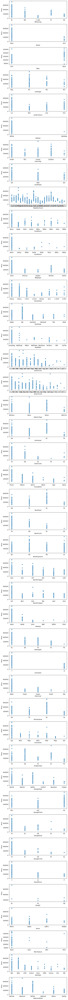

In [21]:
plt.figure(figsize=(7,100),facecolor='white')
plotnumber=1

for column in cat_data:
  if plotnumber<=43:
    ax=plt.subplot(43,1,plotnumber)
    sns.scatterplot(data=cat_data,x=column,y=target)
    plt.xlabel(column,fontsize=10)
    plt.ylabel("Price",fontsize=10)
  plotnumber+=1
plt.tight_layout()

### **Insights from Biivariant analysis Categorical columns**
* Homes in areas zoned as "MSZoning" tend to have higher prices compared to other zones.
* Properties with paved streets command significantly higher prices than those with gravel streets. However, the type of alley access doesn't have a substantial impact on prices.
* Properties with a "Lvl" (near flat/level) land contour tend to have higher prices compared to other contour types.
* Homes in "Normal" conditions (both Condition1 and Condition2) have higher prices compared to other condition types.
* Two-story and one-story house styles are associated with higher prices.
* Homes with a "CompShg" roof material tend to be priced higher than those with other materials.
* Properties with an attached garage ("Attchd" GarageType) generally have higher prices compared to other garage types.
* Finished and roughly finished garages command higher prices than unfinished garages.
* Homes with an "Average" GarageQual rating tend to have higher prices than those with other ratings.
* Properties with a paved driveway ("Y" in PavedDrive) have higher prices than those with partial or dirt driveways.
* Homes with a shed as a miscellaneous feature tend to have higher prices than those with other features.
* "Warranty Deed" SaleType and "Normal" SaleCondition are associated with higher property prices compared to other sales types and conditions.

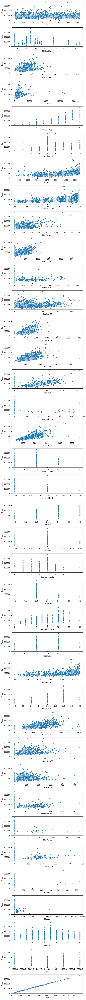

In [22]:
plt.figure(figsize=(7,90),facecolor='white')
plotnumber=1

for column in num_data:
  if plotnumber<=43:
    ax=plt.subplot(43,1,plotnumber)
    sns.scatterplot(data=num_data,x=column,y=target)
    plt.xlabel(column,fontsize=10)
    plt.ylabel("Price",fontsize=10)
  plotnumber+=1
plt.tight_layout()

### **Insights from Biivariant analysis Numerical columns**
* House prices tend to be higher for "MSSubClass" categories 20 (1-STORY 1946 & NEWER ALL STYLES), 60 (2-STORY 1946 & NEWER), and 70 (2-STORY 1945 & OLDER) compared to other categories.
* Properties with a "LotFrontage" between 100 to 150 tend to command higher house prices.
* As the "OverallQual" rating increases, house prices also increase.
* More recently built and remodeled houses tend to have higher prices.
* Higher "TotalBsmtSF" (Total square feet of basement area) is associated with higher house prices.
* Larger "1stFlrSF" (First Floor square feet) and "2ndFlrSF" (Second floor square feet) result in higher house prices.
* Expansive "GrLivArea" (above-grade living area square feet) corresponds to higher house prices.
* Properties with a higher grade of "FullBath" tend to have higher house prices.
* A higher grade of "TotRmsAbvGrd" (total rooms above grade) is linked to higher house prices.
* Increasing "GarageArea" is associated with higher house prices.

# DATA PREPROCESSING

In [23]:
#Handling missing values
data.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [24]:
# Summarize null values by column
null_values = data.isnull()
null_counts = null_values.sum()
significant_null_columns = null_counts[null_counts > 0]

print("\nColumns with significant null values:")
print(significant_null_columns)


Columns with significant null values:
LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


In [25]:
(significant_null_columns/len(data))*100 # It display the percentage of null values

LotFrontage     17.739726
Alley           93.767123
MasVnrType       0.547945
MasVnrArea       0.547945
BsmtQual         2.534247
BsmtCond         2.534247
BsmtExposure     2.602740
BsmtFinType1     2.534247
BsmtFinType2     2.602740
Electrical       0.068493
FireplaceQu     47.260274
GarageType       5.547945
GarageYrBlt      5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageCond       5.547945
PoolQC          99.520548
Fence           80.753425
MiscFeature     96.301370
dtype: float64

In [26]:
# columns to drop
# Alley, PoolQC, Fence, MiscFeature
# because these columns have missing values more than 50%
# and we removed the Id column since it has no use

In [27]:
data.drop(['Id','Alley','PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

In [28]:
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


In [29]:
# Get a list of all categorical columns
categorical_columns = data.select_dtypes(include=['object']).columns.tolist()

# Check for null values in the categorical columns
categorical_columns_with_null = data[categorical_columns].isnull().any()

# Filter categorical columns with null values
categorical_columns_with_null = categorical_columns_with_null[categorical_columns_with_null].index.tolist()


In [30]:
categorical_columns_with_null

['MasVnrType',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond']

In [31]:
# Fill null values in each categorical column with the mode
for column in categorical_columns_with_null:
    mode_value = data[column].mode()[0]  # Calculate the mode
    data[column].fillna(mode_value, inplace=True)  # Fill null values with the mode

# Now, all categorical null values have been filled with their respective modes

In [32]:
data.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath     

In [33]:
# succesfully handled all missing categorical values by using mode

In [34]:
#Handle numerical misiing values
missing_values = data.isnull()

# Select numerical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64'])

# Count missing values in numerical columns
numerical_missing_counts = numerical_columns.isnull().sum()

# Get numerical columns with missing values
numerical_columns_with_missing = numerical_missing_counts[numerical_missing_counts > 0].index.tolist()

In [35]:
numerical_columns_with_missing

['LotFrontage', 'MasVnrArea', 'GarageYrBlt']

In [36]:
data.loc[data['LotFrontage'].isnull()==True,'LotFrontage']=data['LotFrontage'].median()
data.loc[data['MasVnrArea'].isnull()==True,'MasVnrArea']=data['MasVnrArea'].median()
data.loc[data['GarageYrBlt'].isnull()==True,'GarageYrBlt']=data['GarageYrBlt'].median()

In [37]:
data.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd

In [38]:
# we successfully handled all missing values
#So now we doesn't have null values 

# **Conversion of Categorical variables**

In [39]:
num=1
for i in cat_data:
    print(num,i,cat_data[i].unique())
    num+=1

1 MSZoning ['RL' 'RM' 'C (all)' 'FV' 'RH']
2 Street ['Pave' 'Grvl']
3 Alley [nan 'Grvl' 'Pave']
4 LotShape ['Reg' 'IR1' 'IR2' 'IR3']
5 LandContour ['Lvl' 'Bnk' 'Low' 'HLS']
6 Utilities ['AllPub' 'NoSeWa']
7 LotConfig ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
8 LandSlope ['Gtl' 'Mod' 'Sev']
9 Neighborhood ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
10 Condition1 ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
11 Condition2 ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']
12 BldgType ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
13 HouseStyle ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
14 RoofStyle ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
15 RoofMatl ['CompShg' 'WdShngl' 'Metal' 'WdShake' 'Membran' 'Tar&Grv' 'Roll'
 'ClyTil

In [40]:
# here we are using manual encoding
data.MSZoning = data.MSZoning.map({'RL': 0, 'RM': 1, 'C (all)': 2, 'FV': 3, 'RH': 4})
data.Street = data.Street.map({'Pave': 1, 'Grvl': 0})
data.LotShape = data.LotShape.map({'Reg': 0, 'IR1': 1, 'IR2': 2, 'IR3': 3})
data.LandContour = data.LandContour.map({'Lvl': 0, 'Bnk': 1, 'Low': 2, 'HLS': 3})
data.Utilities = data.Utilities.map({'AllPub': 1, 'NoSeWa': 0})
data.LotConfig = data.LotConfig.map({'Inside': 0, 'FR2': 1, 'Corner': 2, 'CulDSac': 3, 'FR3': 4})
data.LandSlope = data.LandSlope.map({'Gtl': 0, 'Mod': 1, 'Sev': 2})
data.Neighborhood = data.Neighborhood.map({'CollgCr': 0, 'Veenker': 1, 'Crawfor': 2, 'NoRidge': 3, 'Mitchel': 4, 'Somerst': 5, 'NWAmes': 6, 'OldTown': 7, 'BrkSide': 8, 'Sawyer': 9, 'NridgHt': 10, 'NAmes': 11, 'SawyerW': 12, 'IDOTRR': 13, 'MeadowV': 14, 'Edwards': 15, 'Timber': 16, 'Gilbert': 17, 'StoneBr': 18, 'ClearCr': 19, 'NPkVill': 20, 'Blmngtn': 21, 'BrDale': 22, 'SWISU': 23, 'Blueste': 24})
data.Condition1 = data.Condition1.map({'Norm': 0, 'Feedr': 1, 'PosN': 2, 'Artery': 3, 'RRAe': 4, 'RRNn': 5, 'RRAn': 6, 'PosA': 7, 'RRNe': 8})
data.Condition2 = data.Condition2.map({'Norm': 0, 'Artery': 1, 'RRNn': 2, 'Feedr': 3, 'PosN': 4, 'PosA': 5, 'RRAn': 6, 'RRAe': 7})
data.BldgType = data.BldgType.map({'1Fam': 0, '2fmCon': 1, 'Duplex': 2, 'TwnhsE': 3, 'Twnhs': 4})
data.HouseStyle = data.HouseStyle.map({'2Story': 0, '1Story': 1, '1.5Fin': 2, '1.5Unf': 3, 'SFoyer': 4, 'SLvl': 5, '2.5Unf': 6, '2.5Fin': 7})
data.RoofStyle = data.RoofStyle.map({'Gable': 0, 'Hip': 1, 'Gambrel': 2, 'Mansard': 3, 'Flat': 4, 'Shed': 5})
data.RoofMatl = data.RoofMatl.map({'CompShg': 0, 'WdShngl': 1, 'Metal': 2, 'WdShake': 3, 'Membran': 4, 'Tar&Grv': 5, 'Roll': 6, 'ClyTile': 7})
data.Exterior1st = data.Exterior1st.map({'VinylSd': 0, 'MetalSd': 1, 'Wd Sdng': 2, 'HdBoard': 3, 'BrkFace': 4, 'WdShing': 5, 'CemntBd': 6, 'Plywood': 7, 'AsbShng': 8, 'Stucco': 9, 'BrkComm': 10, 'AsphShn': 11, 'Stone': 12, 'ImStucc': 13, 'CBlock': 14})
data.Exterior2nd = data.Exterior2nd.map({'VinylSd': 0, 'MetalSd': 1, 'Wd Shng': 2, 'HdBoard': 3, 'Plywood': 4, 'Wd Sdng': 5, 'CmentBd': 6, 'BrkFace': 7, 'Stucco': 8, 'AsbShng': 9, 'Brk Cmn': 10, 'ImStucc': 11, 'AsphShn': 12, 'Stone': 13, 'Other': 14, 'CBlock': 15})
data.MasVnrType = data.MasVnrType.map({'BrkFace': 0, 'None': 1, 'Stone': 2, 'BrkCmn': 3})
data.ExterQual = data.ExterQual.map({'Gd': 0, 'TA': 1, 'Ex': 2, 'Fa': 3})
data.ExterCond = data.ExterCond.map({'TA': 0, 'Gd': 1, 'Fa': 2, 'Po': 3, 'Ex': 4})
data.Foundation = data.Foundation.map({'PConc': 0, 'CBlock': 1, 'BrkTil': 2, 'Wood': 3, 'Slab': 4, 'Stone': 5})
data.BsmtQual = data.BsmtQual.map({'Gd': 0, 'TA': 1, 'Ex': 2, 'Fa': 3})
data.BsmtCond = data.BsmtCond.map({'TA': 0, 'Gd': 1, 'Fa': 2, 'Po': 3})
data.BsmtExposure = data.BsmtExposure.map({'No': 0, 'Gd': 1, 'Mn': 2, 'Av': 3})
data.BsmtFinType1 = data.BsmtFinType1.map({'GLQ': 0, 'ALQ': 1, 'Unf': 2, 'Rec': 3, 'BLQ': 4, 'LwQ': 5})
data.BsmtFinType2 = data.BsmtFinType2.map({'Unf': 0, 'BLQ': 1, 'ALQ': 2, 'Rec': 3, 'LwQ': 4, 'GLQ': 5})
data.Heating = data.Heating.map({'GasA': 0, 'GasW': 1, 'Grav': 2, 'Wall': 3, 'OthW': 4, 'Floor': 5})
data.HeatingQC = data.HeatingQC.map({'Ex': 0, 'Gd': 1, 'TA': 2, 'Fa': 3, 'Po': 4})
data.CentralAir = data.CentralAir.map({'Y': 1, 'N': 0})
data.Electrical = data.Electrical.map({'SBrkr': 0, 'FuseF': 1, 'FuseA': 2, 'FuseP': 3, 'Mix': 4, 'SBkr': 5})
data.KitchenQual = data.KitchenQual.map({'Gd': 0, 'TA': 1, 'Ex': 2, 'Fa': 3})
data.Functional = data.Functional.map({'Typ': 0, 'Min1': 1, 'Maj1': 2, 'Min2': 3, 'Mod': 4, 'Maj2': 5, 'Sev': 6})
data.FireplaceQu = data.FireplaceQu.map({'Gd': 0, 'TA': 1, 'Fa': 2, 'Ex': 3, 'Po': 4})
data.GarageType = data.GarageType.map({'Attchd': 0, 'Detchd': 1, 'BuiltIn': 2, 'CarPort': 3, 'Basment': 4, '2Types': 5})
data.GarageFinish = data.GarageFinish.map({'RFn': 0, 'Unf': 1, 'Fin': 2})
data.GarageQual = data.GarageQual.map({'TA': 0, 'Fa': 1, 'Gd': 2, 'Ex': 3, 'Po': 4})
data.GarageCond = data.GarageCond.map({'TA': 0, 'Fa': 1, 'Gd': 2, 'Po': 3, 'Ex': 4})
data.PavedDrive = data.PavedDrive.map({'Y': 1, 'N': 0, 'P': 2})
data.SaleType = data.SaleType.map({'WD': 0, 'New': 1, 'COD': 2, 'ConLD': 3, 'ConLI': 4, 'CWD': 5, 'ConLw': 6, 'Con': 7, 'Oth': 8})
data.SaleCondition = data.SaleCondition .map({'Normal': 0, 'Abnorml': 1, 'Partial': 2, 'AdjLand': 3, 'Alloca': 4, 'Family': 5})

In [41]:
#checking all values are converted or not
cat_data=data.select_dtypes(include=["O"])
print("categorical columns",cat_data.columns)

categorical columns Index([], dtype='object')


In [42]:
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,0,65.0,8450,1,0,0,1,0,0,0,0,0,0,0,7,5,2003,2003,0,0,0,0,0,196.0,0,0,0,0,0,0,0,706,0,0,150,856,0,0,1,0,856,854,0,1710,1,0,2,1,3,1,0,8,0,0,0,0,2003.0,0,2,548,0,0,1,0,61,0,0,0,0,0,2,2008,0,0,208500
1,20,0,80.0,9600,1,0,0,1,1,0,1,1,0,0,1,6,8,1976,1976,0,0,1,1,1,0.0,1,0,1,0,0,1,1,978,0,0,284,1262,0,0,1,0,1262,0,0,1262,0,1,2,0,3,1,1,6,0,1,1,0,1976.0,0,2,460,0,0,1,298,0,0,0,0,0,0,5,2007,0,0,181500
2,60,0,68.0,11250,1,1,0,1,0,0,0,0,0,0,0,7,5,2001,2002,0,0,0,0,0,162.0,0,0,0,0,0,2,0,486,0,0,434,920,0,0,1,0,920,866,0,1786,1,0,2,1,3,1,0,6,0,1,1,0,2001.0,0,2,608,0,0,1,0,42,0,0,0,0,0,9,2008,0,0,223500
3,70,0,60.0,9550,1,1,0,1,2,0,2,0,0,0,0,7,5,1915,1970,0,0,2,2,1,0.0,1,0,2,1,1,0,1,216,0,0,540,756,0,1,1,0,961,756,0,1717,1,0,1,0,3,1,0,7,0,1,0,1,1998.0,1,3,642,0,0,1,0,35,272,0,0,0,0,2,2006,0,1,140000
4,60,0,84.0,14260,1,1,0,1,1,0,3,0,0,0,0,8,5,2000,2000,0,0,0,0,0,350.0,0,0,0,0,0,3,0,655,0,0,490,1145,0,0,1,0,1145,1053,0,2198,1,0,2,1,4,1,0,9,0,1,1,0,2000.0,0,3,836,0,0,1,192,84,0,0,0,0,0,12,2008,0,0,250000


In [43]:
#So we there are no categorical columns in the data

# FEATURE ENGINEERING

In [44]:
pd.set_option('display.max_columns',None)
num_data.head(10)

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.0,14115,5,5,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.0,10084,8,5,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000
7,8,60,NaN,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.0,6120,7,5,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.0,7420,5,6,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,2008,118000


In [45]:
num_data.drop(["Id"],axis=1,inplace=True)

In [46]:
num_data.shape

(1460, 37)

<AxesSubplot:>

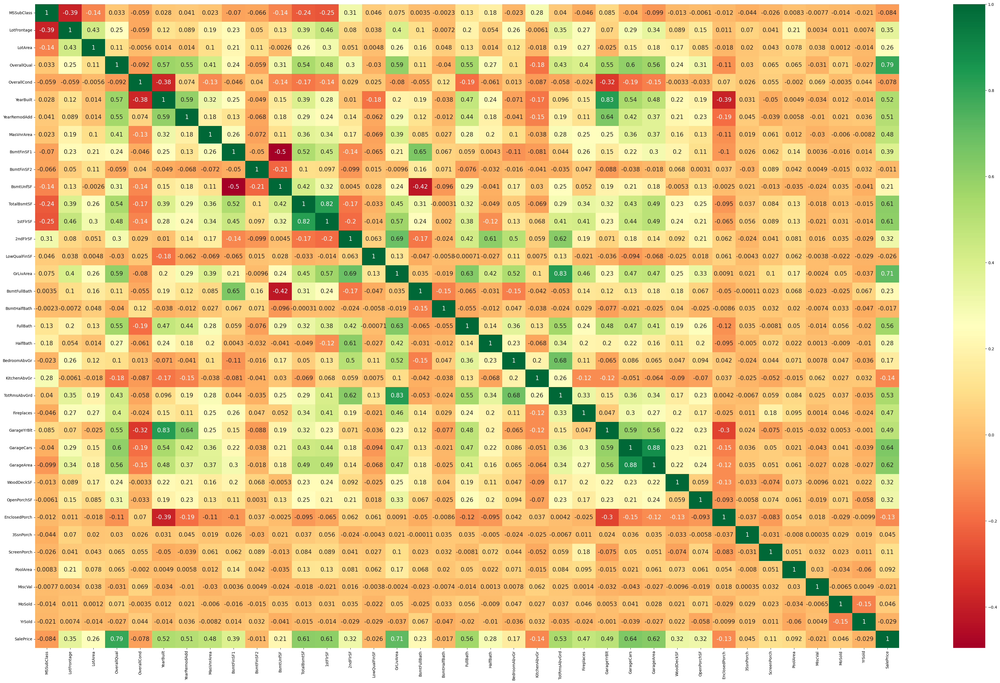

In [47]:
# checking the correlation in numerical columns
plt.figure(figsize=(50, 30))
sns.heatmap(num_data.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":15})

In [48]:
# Column "YearBuilt" and "GarageYrBlt" have a correlation of 0.83
# Column "TotalBsmtSF" and "1stFlrSF" have a correlation of 0.82
# Column "GrLivArea" and "TotRmsAbvGrd" have a correlation of 0.83
# Column "GarageCars" and "GarageArea" have a correlation of 0.88

In [49]:
num_data.drop(["GarageYrBlt","1stFlrSF","TotRmsAbvGrd","GarageCars"],axis=1,inplace=True)

In [50]:
 #so we drop one of these
data.drop(["GarageYrBlt","1stFlrSF","TotRmsAbvGrd","GarageCars"],axis=1,inplace=True)

In [51]:
# checking the columns which have least corelations with target values
from logging import NullHandler

df = num_data
correlations = df.corr()['SalePrice']
filtered_correlations = correlations[(correlations >= -0.1) & (correlations <= 0.2)]
print(filtered_correlations)

MSSubClass     -0.084284
OverallCond    -0.077856
BsmtFinSF2     -0.011378
LowQualFinSF   -0.025606
BsmtHalfBath   -0.016844
BedroomAbvGr    0.168213
3SsnPorch       0.044584
ScreenPorch     0.111447
PoolArea        0.092404
MiscVal        -0.021190
MoSold          0.046432
YrSold         -0.028923
Name: SalePrice, dtype: float64


In [52]:
# dropping the columns
num_data.drop(["MSSubClass", "OverallCond", "BsmtFinSF2",
               "LowQualFinSF", "BsmtHalfBath", "BedroomAbvGr",
              "3SsnPorch", "ScreenPorch", "PoolArea",
               "MiscVal", "MoSold", "YrSold"],axis=1,inplace=True)

In [53]:
# dropping the columns in data
data.drop(["MSSubClass", "OverallCond", "BsmtFinSF2","LowQualFinSF", "BsmtHalfBath", "BedroomAbvGr", "ScreenPorch",
           "PoolArea","MiscVal", "MoSold", "YrSold"],axis=1, inplace=True)

In [54]:
#Preprocessed data
data.to_csv('preprocessed_data.csv', index=False)

# MODEL CREATION

In [55]:
from sklearn.model_selection import train_test_split

X = data.iloc[:,:-1]
y = data.SalePrice
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [56]:
X

,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenAbvGr,KitchenQual,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,SaleType,SaleCondition
0,0,65.0,8450,1,0,0,1,0,0,0,0,0,0,0,7,2003,2003,0,0,0,0,0,196.0,0,0,0,0,0,0,0,706,0,150,856,0,0,1,0,854,1710,1,2,1,1,0,0,0,0,0,0,548,0,0,1,0,61,0,0,0,0
1,0,80.0,9600,1,0,0,1,1,0,1,1,0,0,1,6,1976,1976,0,0,1,1,1,0.0,1,0,1,0,0,1,1,978,0,284,1262,0,0,1,0,0,1262,0,2,0,1,1,0,1,1,0,0,460,0,0,1,298,0,0,0,0,0
2,0,68.0,11250,1,1,0,1,0,0,0,0,0,0,0,7,2001,2002,0,0,0,0,0,162.0,0,0,0,0,0,2,0,486,0,434,920,0,0,1,0,866,1786,1,2,1,1,0,0,1,1,0,0,608,0,0,1,0,42,0,0,0,0
3,0,60.0,9550,1,1,0,1,2,0,2,0,0,0,0,7,1915,1970,0,0,2,2,1,0.0,1,0,2,1,1,0,1,216,0,540,756,0,1,1,0,756,1717,1,1,0,1,0,0,1,0,1,1,642,0,0,1,0,35,272,0,0,1
4,0,84.0,14260,1,1,0,1,1,0,3,0,0,0,0,8,2000,2000,0,0,0,0,0,350.0,0,0,0,0,0,3,0,655,0,490,1145,0,0,1,0,1053,2198,1,2,1,1,0,0,1,1,0,0,836,0,0,1,192,84,0,0,0,0
5,0,85.0,14115,1,1,0,1,0,0,4,0,0,0,2,5,1993,1995,0,0,0,0,1,0.0,1,0,3,0,0,0,0,732,0,64,796,0,0,1,0,566,1362,1,1,1,1,1,0,0,0,0,1,480,0,0,1,40,30,0,320,0,0
6,0,75.0,10084,1,0,0,1,0,0,5,0,0,0,1,8,2004,2005,0,0,0,0,2,186.0,0,0,0,2,0,3,0,1369,0,317,1686,0,0,1,0,0,1694,1,2,0,1,0,0,1,0,0,0,636,0,0,1,255,57,0,0,0,0
7,0,69.0,10382,1,1,0,1,2,0,6,2,0,0,0,7,1973,1973,0,0,3,3,2,240.0,1,0,1,0,0,2,1,859,1,216,1107,0,0,1,0,983,2090,1,2,1,1,1,0,2,1,0,0,484,0,0,1,235,204,228,0,0,0
8,1,51.0,6120,1,0,0,1,0,0,7,3,0,0,2,7,1931,1950,0,0,4,2,1,0.0,1,0,2,1,0,0,2,0,0,952,952,0,1,1,1,752,1774,0,2,0,2,1,1,2,1,1,1,468,1,0,1,90,0,205,0,0,1
9,0,50.0,7420,1,0,0,1,2,0,8,3,1,1,3,5,1939,1950,0,0,1,1,1,0.0,1,0,2,1,0,0,0,851,0,140,991,0,0,1,0,0,1077,1,1,0,2,1,0,2,1,0,0,205,2,0,1,0,4,0,0,0,0


In [57]:
y

0       208500
1       181500
2       223500
3       140000
4       250000
5       143000
6       307000
7       200000
8       129900
9       118000
10      129500
11      345000
12      144000
13      279500
14      157000
15      132000
16      149000
17       90000
18      159000
19      139000
20      325300
21      139400
22      230000
23      129900
24      154000
25      256300
26      134800
27      306000
28      207500
29       68500
30       40000
31      149350
32      179900
33      165500
34      277500
35      309000
36      145000
37      153000
38      109000
39       82000
40      160000
41      170000
42      144000
43      130250
44      141000
45      319900
46      239686
47      249700
48      113000
49      127000
50      177000
51      114500
52      110000
53      385000
54      130000
55      180500
56      172500
57      196500
58      438780
59      124900
60      158000
61      101000
62      202500
63      140000
64      219500
65      317000
66      18

# Ridge Regression
# Lasso Regression
# Elastic Net Regression
# Support Vector Regression (SVR)
# Random Forest Regression
# Gradient boosting

In [61]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
# Initialize and train the models
# Standardize features (optional but recommended for Logistic Regression)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

models = {
    "Linear Regression": LinearRegression(),
    "Lasso Regression": Lasso(alpha=0.01),
    "Ridge Regression": Ridge(alpha=1.0),
    "Random Forest Regression": RandomForestRegressor(n_estimators=100, random_state=42),
    "GradientBoostingRegressor": GradientBoostingRegressor(n_estimators=100, random_state=42)}
results = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    results[name] = {
        "Mean Squared Error": mse,
        "R-squared": r2
    }

# Compare the performance of the models
print("Model Comparison:")
for name, metrics in results.items():
    print(f"{name}:")
    print(f"  Mean Squared Error: {metrics['Mean Squared Error']:.2f}")
    print(f"  R-squared: {metrics['R-squared']:.2f}")
    print()

# Find the best-performing model
best_model = min(results, key=lambda x: results[x]['Mean Squared Error'])
print(f"The best model is: {best_model}")


Model Comparison:
Linear Regression:
  Mean Squared Error: 1219956658.31
  R-squared: 0.83

Lasso Regression:
  Mean Squared Error: 1219955314.02
  R-squared: 0.83

Ridge Regression:
  Mean Squared Error: 1219281072.87
  R-squared: 0.83

Random Forest Regression:
  Mean Squared Error: 718469962.42
  R-squared: 0.90

GradientBoostingRegressor:
  Mean Squared Error: 700016824.23
  R-squared: 0.90

The best model is: GradientBoostingRegressor


In [64]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

knn_regressor = KNeighborsRegressor(n_neighbors=5)
knn_regressor.fit(X_train, y_train)

y_pred = knn_regressor.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

r2 = r2_score(y_test, y_pred)
print("R-squared (R2) score:", r2)


Mean Squared Error: 1628692715.015251
R-squared (R2) score: 0.7665991930157132


# **Model Comparision Report**

**The Machine Learning models used here are**


1.  Linear Regression
2.  Lasso Regression
3.  Ridge Regression
4.  Random Forest Regression
5.  GradientBoostingRegressor
6.  KNN Regressor    

Apparently we can see the R2 score of the models

**Model Comparison:**

**Linear Regression:**
>  R2-squared: 0.83*

**Lasso Regression:**
>  R2-squared: 0.83*

**Ridge Regression:**
>  R2-squared: 0.83*

**Random Forest Regression:**
>  R2-squared: 0.90*

**GradientBoostingRegressor:**
>  R2-squared: 0.91*


**KNN Regressor**
>  R-squared: 0.75*

From the above ML models we can see that GradientBoosting(XGBoost) gives the highest amount of prediction approximately 91% and the least is KNN Regressor which is
approximately 67%

### **I would highly recommend the best model for production for the house price prediction dataset is Gradient Boosting(XGBoosting)**



# **Challenges Faced**

The challenges we faced is when we were doing feature engineering we have dropped one of the columns which have corelations with other pair but we couldn't identify the column which has least corelation with target column in our case [SalePrice] but we have come across that after doing some research in the internet.

We tried to achieve above 95% of accuracy in the model prediction but due to less domain knowledge in the dataset we don't know which column is not useful for the dataset.

# **Conclusion**

**In conclusion, our predictive model effectively analyzed the dataset and provided valuable insights.**

**This project demonstrates the power of data-driven solutions and highlights the importance of thorough analysis in generating actionable insights.**